# Mouse snRNA Annotation
## Heart

In [1]:
library(Matrix)
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(tidyverse))
suppressPackageStartupMessages(library(viridis))
library(RColorBrewer)
library(data.table)
options(future.globals.maxSize = 10000 * 1024^2)
future.seed=TRUE
source("plotting_functions.R")

Warning message in system("timedatectl", intern = TRUE):
"running command 'timedatectl' had status 1"

Attaching package: 'data.table'


The following objects are masked from 'package:dplyr':

    between, first, last


The following object is masked from 'package:purrr':

    transpose




In [2]:
system("mkdir ../../plots/")
system("mkdir ../../plots/qc")
system("mkdir ../../plots/clustering")
system("mkdir ../../plots/annotation")

In [2]:
tissue = "heart"
abrv = "H"
synapse_id = "EAID_000087"
enc_abrv= "HRT"
markers_tissue = "Heart"

# Read in data

In [3]:
obj = readRDS(paste0("../../seurat/",tissue,"_Parse_10x_integrated.rds"))
obj$sample = factor(obj$sample, 
                    levels = paste0(abrv,"_",rep(c("4","10","14","25","36","2m","18m"),each=4),rep(c("_M","_F"),each=2),c("_1","_2")))
Idents(obj) = obj$seurat_clusters

In [4]:
sample_cols = spectral_cols(obj@meta.data,"sample")
cluster_cols = set1_cols(obj@meta.data,"seurat_clusters")
depth2_cols = c("#01a0de","#d885ce","#7f1c72")
tech_cols = c("#01a0de","#7f1c72")
sex_cols = c("#f8b4c5","#2900ff")
annot_cols = read.csv("../../../../figures/data/enc4_mouse_snrna_celltypes.csv")
annot_cols = annot_cols[annot_cols$tissue == str_to_title(tissue),]

# QC plots

### Knee plot

In [6]:
tenx_only = subset(obj,subset=technology == "10x")

parse_only = subset(obj,subset=technology == "Parse")
parse_shallow = subset(parse_only,subset=depth1 == "shallow")
parse_deep = subset(parse_only,subset=depth1 == "deep")


In [7]:
parse_deep_knee_plot = knee_df(parse_deep@assays$RNA@counts, "Parse long-read match")
parse_standard_knee_plot = knee_df(parse_shallow@assays$RNA@counts, "Parse standard")
tenx_knee_plot = knee_df(tenx_only@assays$RNA@counts, "10x")

Warning message:
"Transformation introduced infinite values in continuous y-axis"


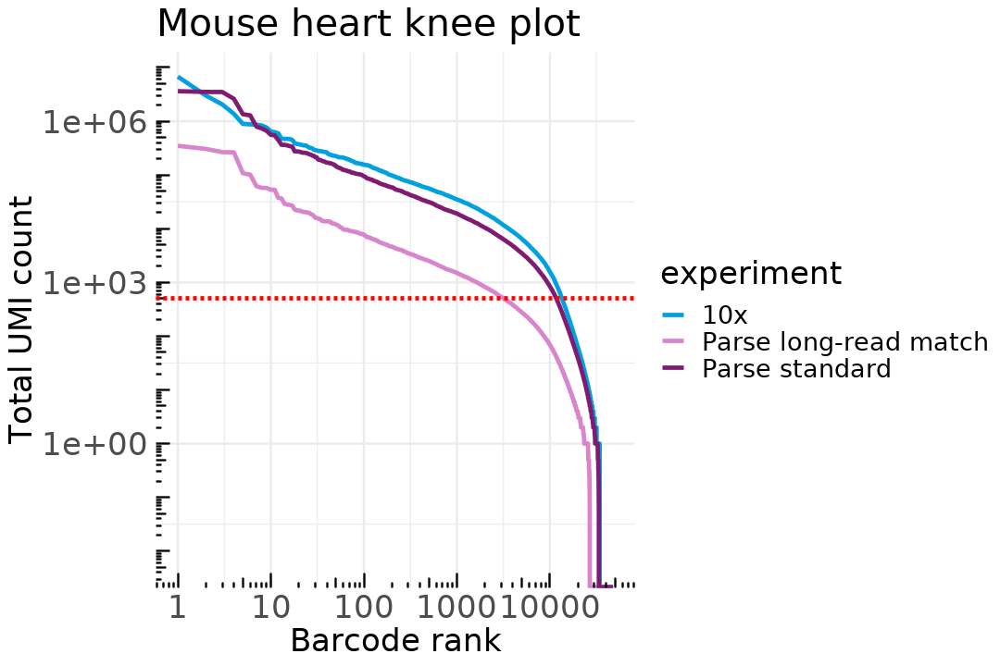

In [8]:
options(repr.plot.width = 9, repr.plot.height = 6)

p = ggplot(rbind(parse_deep_knee_plot,parse_standard_knee_plot,tenx_knee_plot), 
       aes(rank, total, group = experiment, color = experiment))  +
geom_path(size=1) + theme_minimal() + theme(text = element_text(size = 20))  + 
    theme(axis.text.x = element_text(size = 20),
        axis.text.y = element_text(size = 20)) +
scale_y_log10() + scale_x_log10() + annotation_logticks() +
labs(y = "Total UMI count", x = "Barcode rank", title = paste0("Mouse ", tissue ," knee plot"))  + 
geom_hline(yintercept=500, linetype="dashed", color = "red", size=1) +
scale_color_manual(values = depth2_cols)
p


In [9]:
pdf(file="../../plots/qc/experiment_kneeplots.pdf", width = 9, height = 6)
p
dev.off()

Warning message:
"Transformation introduced infinite values in continuous y-axis"


png 
  2

### Violin plot of QC metrics split by single cell platform

The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
"`fun.y` is deprecated. Use `fun` instead."
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
"`fun.y` is deprecated. Use `fun` instead."
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



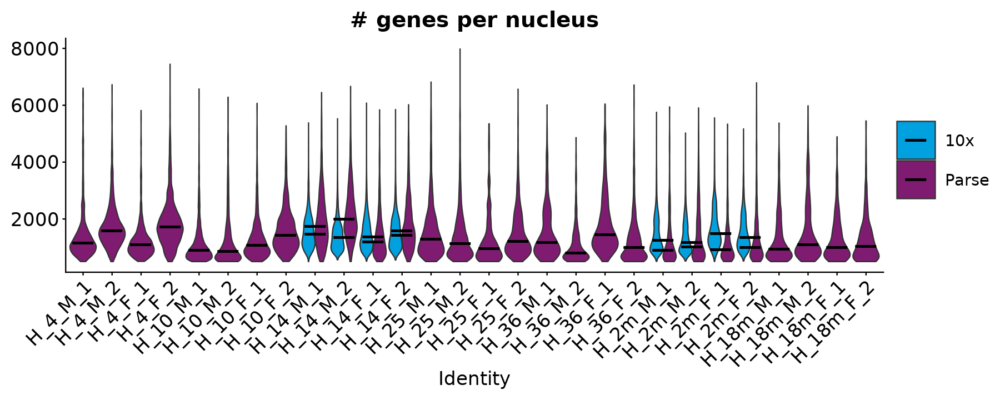

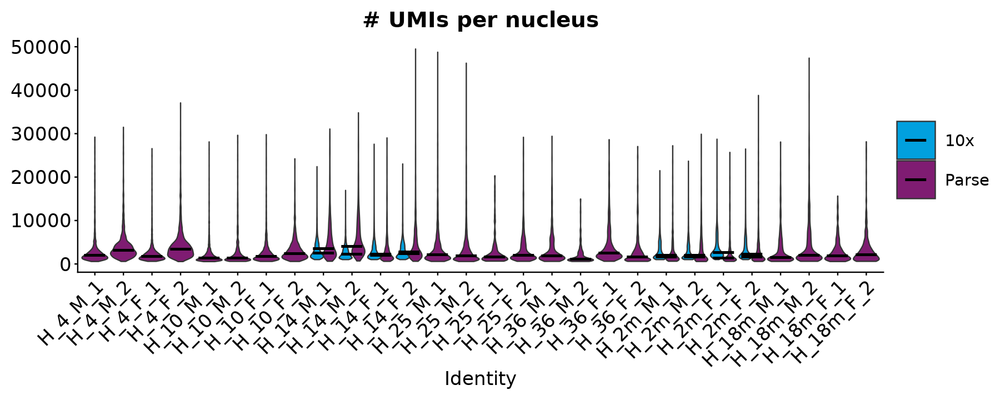

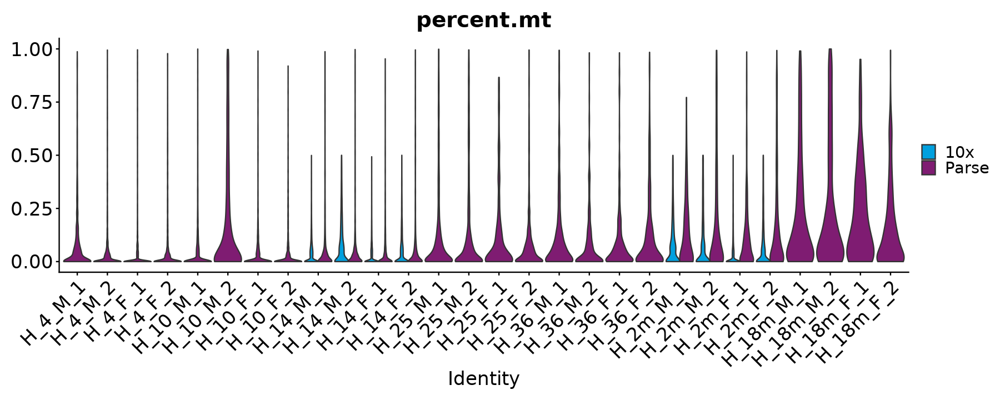

In [5]:
options(repr.plot.width = 15, repr.plot.height = 6)
p = VlnPlot(obj, features = c("nFeature_RNA"), ncol = 1, split.by = "technology",
        pt.size = 0, group.by = "sample")+ ggtitle("# genes per nucleus") +
        scale_fill_manual(values = tech_cols) +
        stat_summary(fun.y = median, geom='point', size = 15, colour = "black", shape = 95) + 
        theme(text = element_text(size = 20),
              axis.text.x = element_text(size = 20),
              axis.text.y = element_text(size = 20))

p1 = VlnPlot(obj, features = c("nCount_RNA"), ncol = 1, split.by = "technology",
        pt.size = 0, group.by = "sample") + ggtitle("# UMIs per nucleus") +
        scale_fill_manual(values = tech_cols) +
        stat_summary(fun.y = median, geom='point', size = 15, colour = "black", shape = 95) + 
        theme(text = element_text(size = 20), 
              axis.text.x = element_text(size = 20), 
              axis.text.y = element_text(size = 20))

p2 = VlnPlot(obj, features = c("percent.mt"), ncol = 1, split.by = "technology",
        pt.size = 0, group.by = "sample") + 
        scale_fill_manual(values = tech_cols) +
        theme(text = element_text(size = 20),
                axis.text.x = element_text(size = 20),
                axis.text.y = element_text(size = 20))
p
p1
p2

In [6]:
pdf(file="../../plots/qc/experiment_violinplots.pdf", width = 15, height = 6)
p
p1
p2
dev.off()

png 
  2

## UMAP "Feature Plots" of QC metadata

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



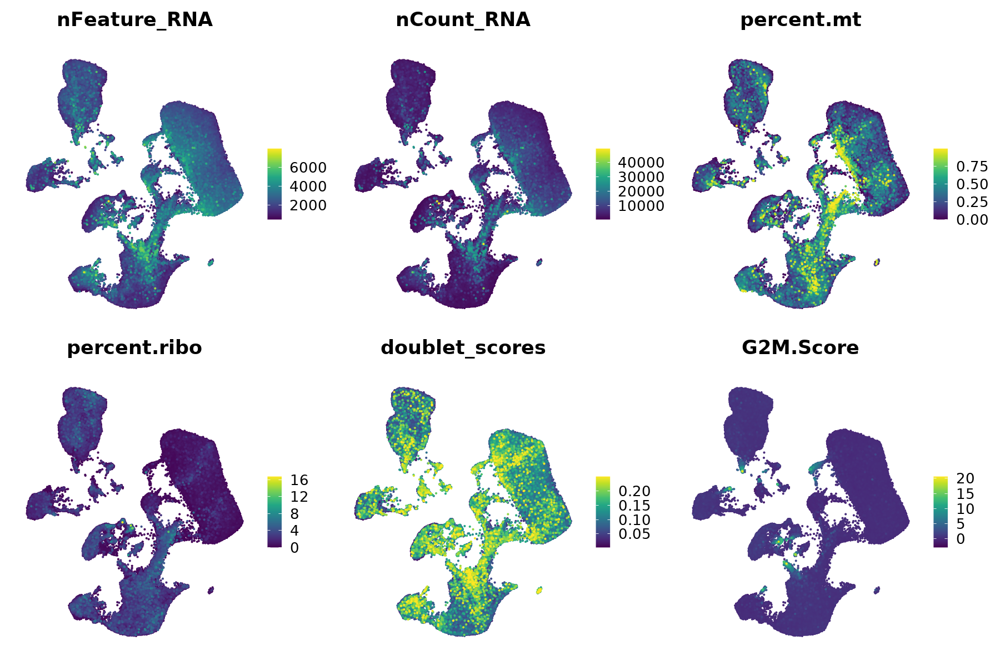

In [7]:
options(repr.plot.width = 15, repr.plot.height = 10)

featureplot(obj,c("nFeature_RNA",
                        "nCount_RNA",
                        "percent.mt",
                        "percent.ribo",
                        "doublet_scores",
                        "G2M.Score"))


In [8]:
pdf(file="../../plots/qc/qc_featureplot.png", width = 15, height = 10)
featureplot(obj,c("nFeature_RNA",
                        "nCount_RNA",
                        "percent.mt",
                        "percent.ribo",
                        "doublet_scores",
                        "G2M.Score"))
dev.off()

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



png 
  2

# Check integration and clustering

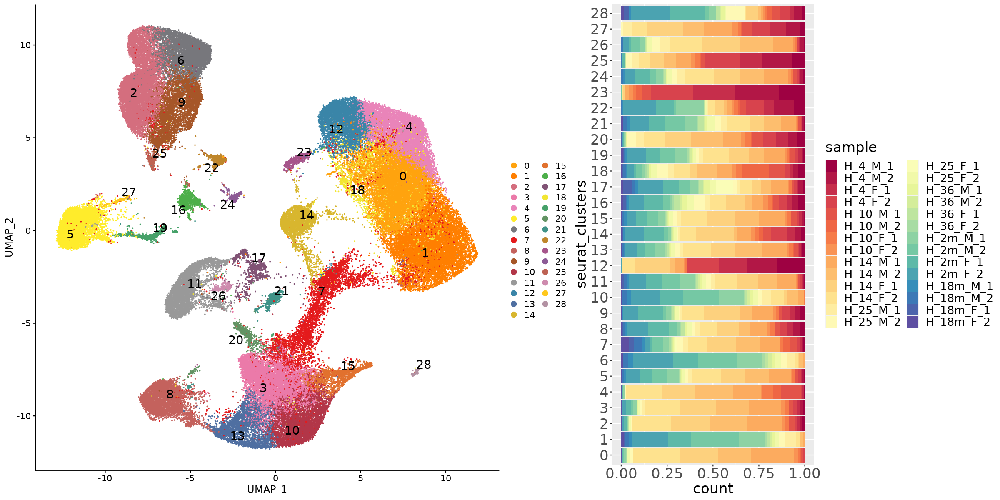

In [9]:
options(repr.plot.width = 20, repr.plot.height = 10)

p1=DimPlot(obj, reduction = "umap", label = TRUE, label.size=6,repel = TRUE, cols = cluster_cols)

p2=ggplot(obj@meta.data, aes(x=seurat_clusters, fill=sample)) + geom_bar(position = "fill") +
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), 
      axis.text.y = element_text(size = 20)) + scale_fill_manual(values = sample_cols) & coord_flip()
gridExtra::grid.arrange(
  p1, p2,
  widths = c(2,1.5),
  layout_matrix = rbind(c(1, 2)))


In [10]:
pdf(file="../../plots/clustering/UMAP_cluster_sample_barplot.pdf",
    width = 20, height = 10)

gridExtra::grid.arrange(
  p1, p2,
  widths = c(2,1.5),
  layout_matrix = rbind(c(1, 2)))


dev.off()

png 
  2

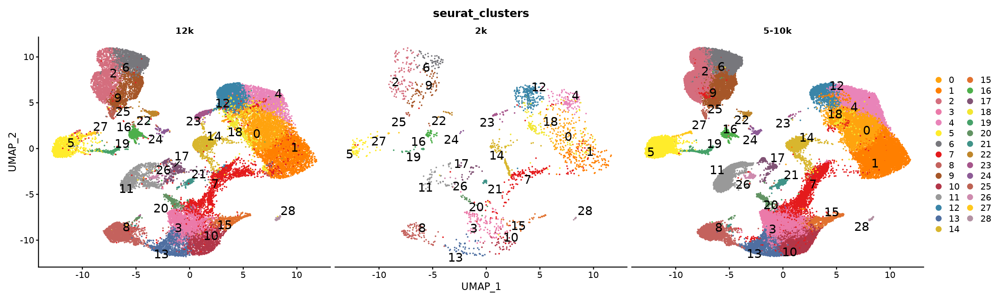

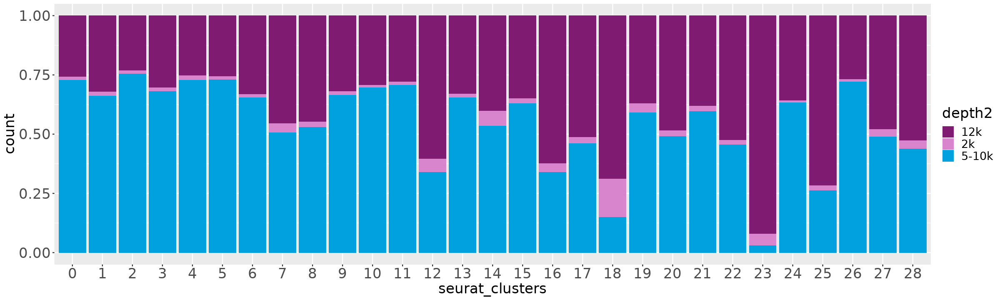

In [11]:
options(repr.plot.width = 20, repr.plot.height = 6)

p = DimPlot(obj, reduction = "umap", group.by = "seurat_clusters",
            split.by = "depth2", label = TRUE, 
            label.size = 6, repel = TRUE, cols = cluster_cols)
p1 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=depth2)) + geom_bar(position = "fill") + 
    scale_fill_manual(values = rev(depth2_cols)) +
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20), 
          axis.text.y = element_text(size = 20))

p
p1

In [12]:
pdf(file="../../plots/clustering/Parse_10x_experiment_distribution.pdf",
    width = 20, height = 6)
p
p1
dev.off()

png 
  2

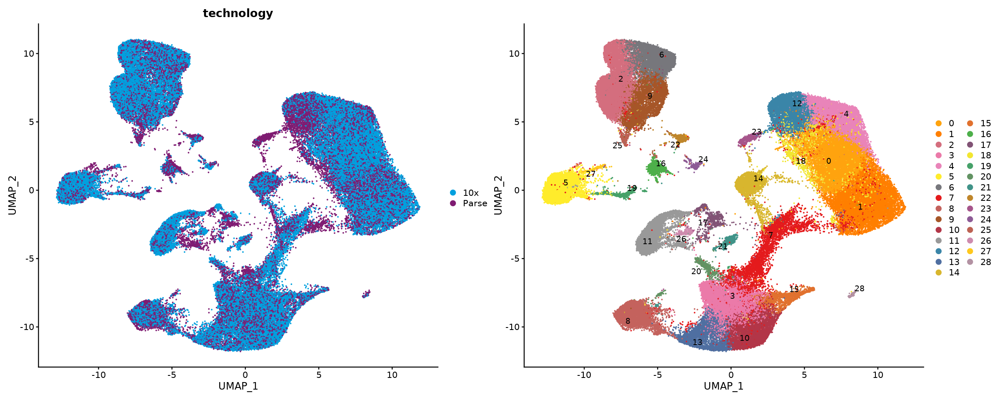

In [13]:
options(repr.plot.width = 20, repr.plot.height = 8)

p1 = DimPlot(obj, reduction = "umap", group.by = "technology", shuffle = T) + scale_color_manual(values = tech_cols)
p2 = DimPlot(obj, reduction = "umap", label = TRUE, repel = TRUE, cols = cluster_cols)
p1 + p2

In [14]:
pdf(file="../../plots/clustering/UMAP_Parse_10x.pdf",
    width = 20, height = 8)
p1 + p2
dev.off()

png 
  2

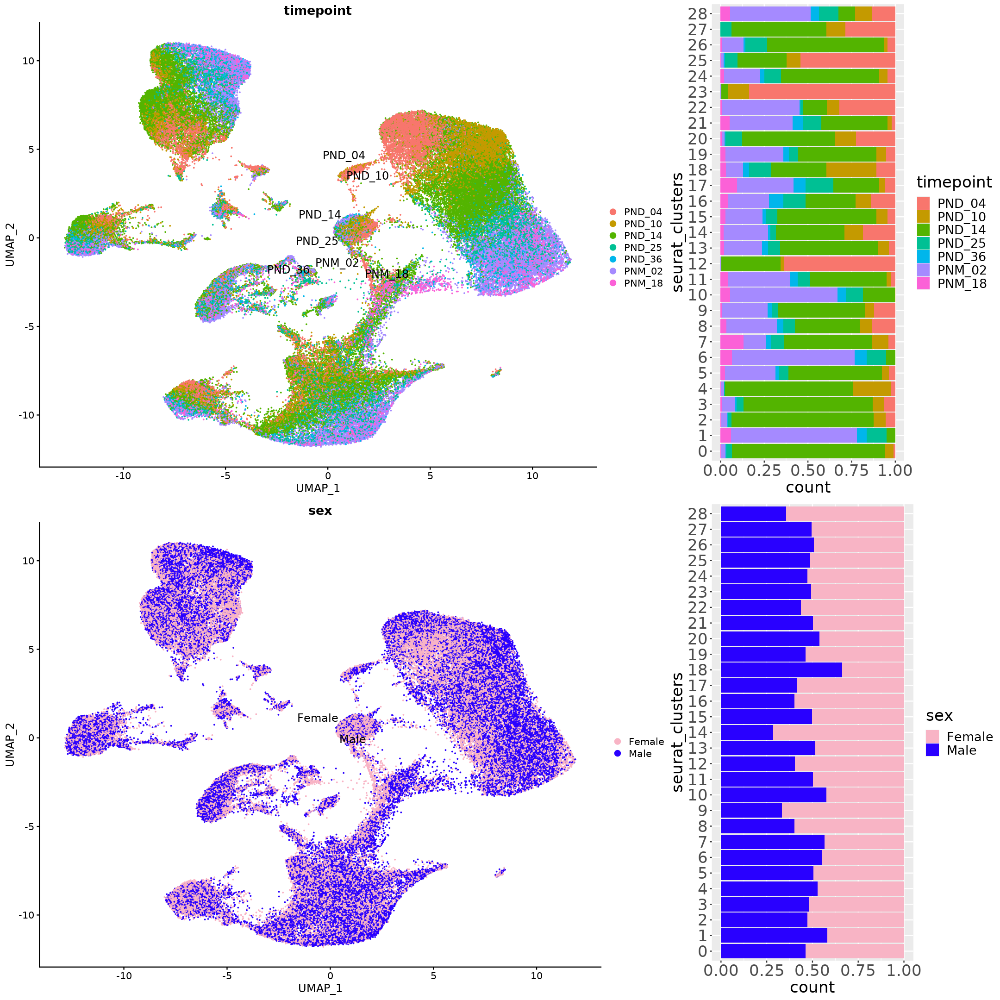

In [15]:
options(repr.plot.width = 18, repr.plot.height = 18)

p1 = DimPlot(obj, reduction = "umap", group.by = "timepoint", label = TRUE, label.size = 5, repel = TRUE)
p2 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=timepoint)) + geom_bar(position = "fill") + 
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) & coord_flip()

p3 = DimPlot(obj, reduction = "umap", group.by = "sex", label = TRUE, label.size = 5, repel = TRUE, shuffle = T) + scale_color_manual(values = sex_cols)
p4 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=sex)) + geom_bar(position = "fill") + scale_fill_manual(values = sex_cols) +
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) & coord_flip()
gridExtra::grid.arrange(
  p1, p2, p3, p4,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                        c(3, 4)))



In [16]:
pdf(file="../../plots/clustering/UMAP_age_sex_barplot.pdf",
    width = 18, height = 18)
gridExtra::grid.arrange(
  p1, p2, p3, p4,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                        c(3, 4)))

dev.off()

png 
  2

# Celltype annotation

### Check predictions

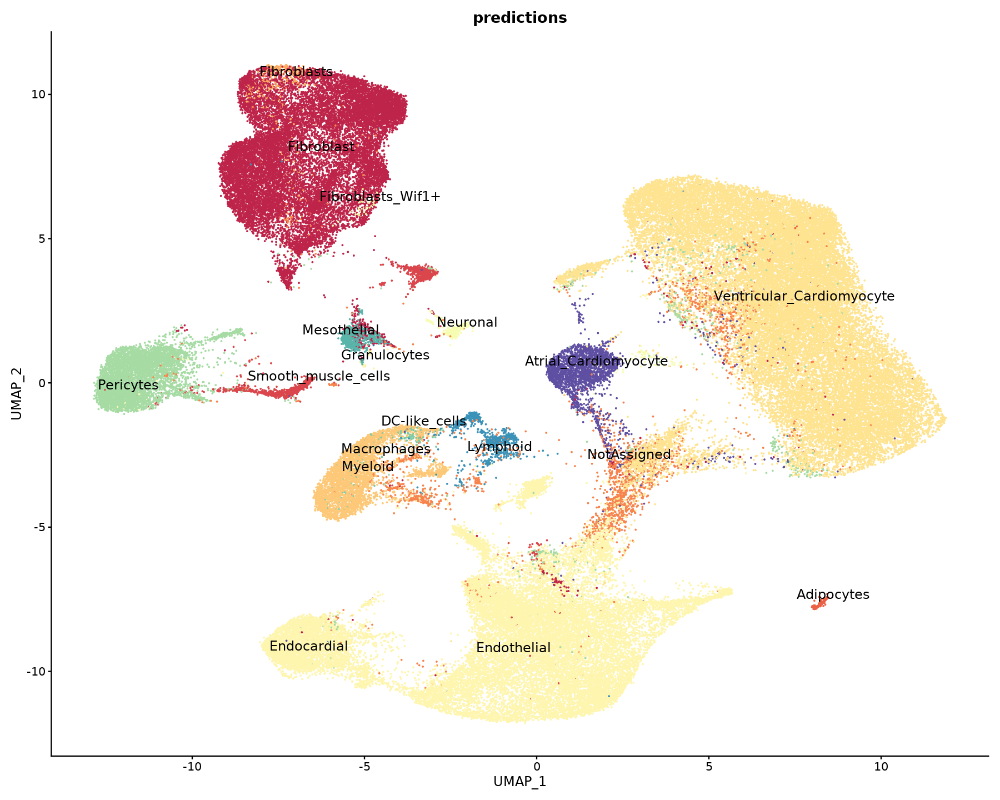

In [17]:
options(repr.plot.width = 15, repr.plot.height = 12)

cols = sample(spectral_cols(obj@meta.data,"predictions"))
umap1 = DimPlot(obj, reduction = "umap", group.by = "predictions", label = TRUE, 
                        label.size = 5, repel = TRUE) + 
    scale_color_manual(values = cols)

umap1 & NoLegend()



In [18]:
pdf(file="../../plots/annotation/UMAPs_predictions.pdf",
    width = 15, height = 12)
umap1 & NoLegend()
dev.off()


png 
  2

### Check marker gene expression

In [19]:
DefaultAssay(obj) = "SCT"

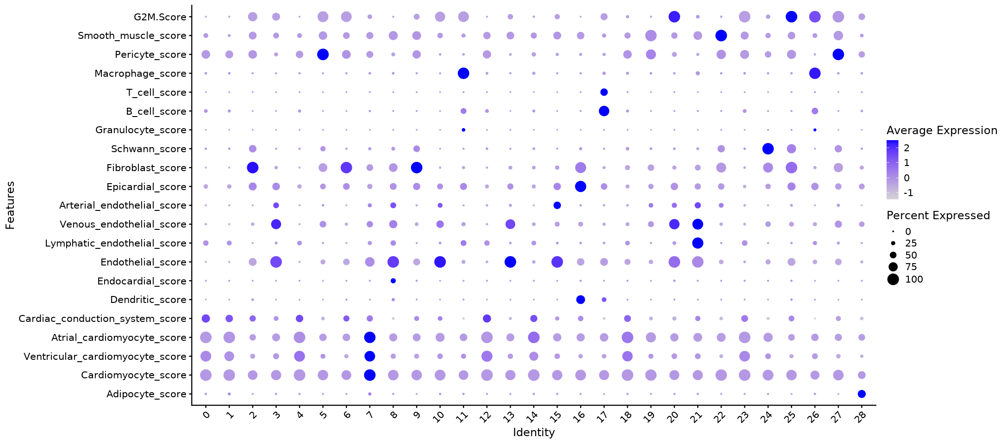

In [20]:
markers = read.csv("../../../ref/IGVF_curated_markers.csv")
markers = markers[markers$Tissue == markers_tissue,]
markers = markers[markers$Gene %in% rownames(obj),]

for (celltype in unique(markers$Subtype)){
    label = paste0(celltype,"_score")
    genes = unique(markers$Gene[markers$Subtype == celltype])
    obj[[label]] = PercentageFeatureSet(obj,features = genes)
    
}
options(repr.plot.width = 18, repr.plot.height= 8)
Idents(obj) = obj$seurat_clusters
p = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 
p

In [21]:
pdf(file="../../plots/annotation/cluster_marker_dotplot.pdf",width = 24, height = 5)
p
dev.off()

png 
  2

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



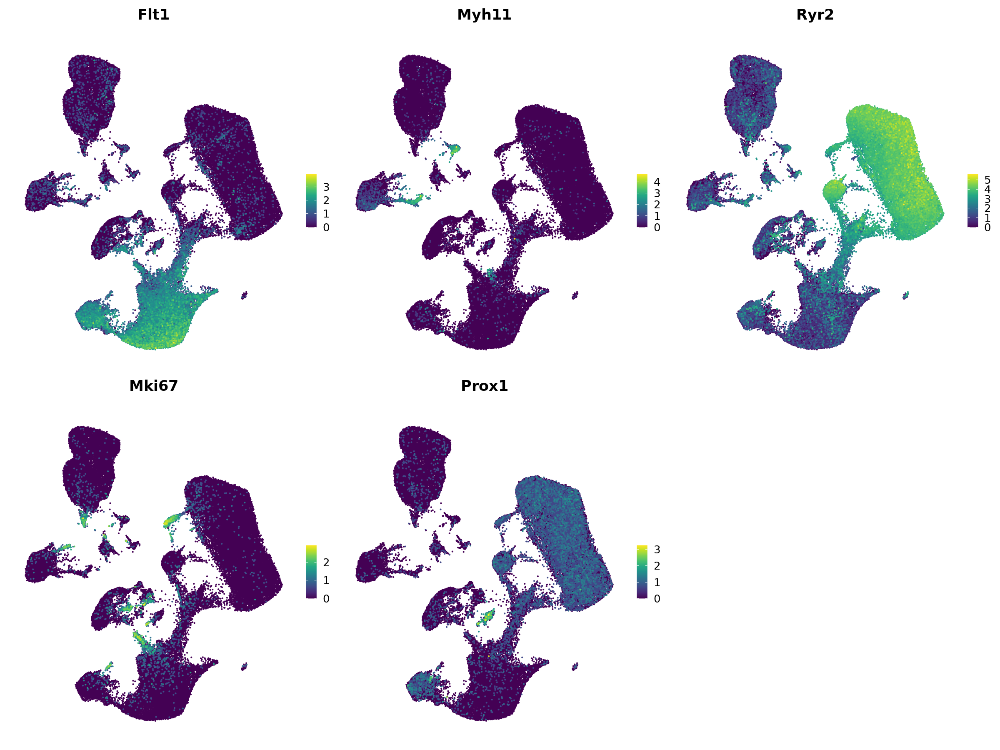

In [22]:
options(repr.plot.width = 20, repr.plot.height= 15)

featureplot(obj,c("Flt1","Myh11","Ryr2","Mki67","Prox1"))


In [23]:
pdf(file="../../plots/annotation/celltype_featureplot.pdf",width = 20, height = 15)
featureplot(obj,c("Flt1","Myh11","Ryr2","Mki67","Prox1"))
dev.off()

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



png 
  2

## Order clusters

In [24]:
Idents(obj) = obj$seurat_clusters
order = c(1, # cm adult
         0,4,18, # cm juvenile
         12, # cm infant
         23, # CM cycling
         14, # atrial CM
         7,3,15,13, # endothelial_juvenile
         10, # endothelial_adult
         20, # cycling endothelial
         21, # lymph endo
         8, # endocardial
         16, # epicardial
         2,9, # fibro
         6, # fibro_adult
         25, # fibro cycle
         5, # peri
         27, # peri cycling
         19,22, # SM
         11, # macrophage
         26, # macrophage cycling
         17, # Lymphocyte
         28, # adipo
         24 # schwann
         )
Idents(obj) = factor(Idents(obj), levels = order)


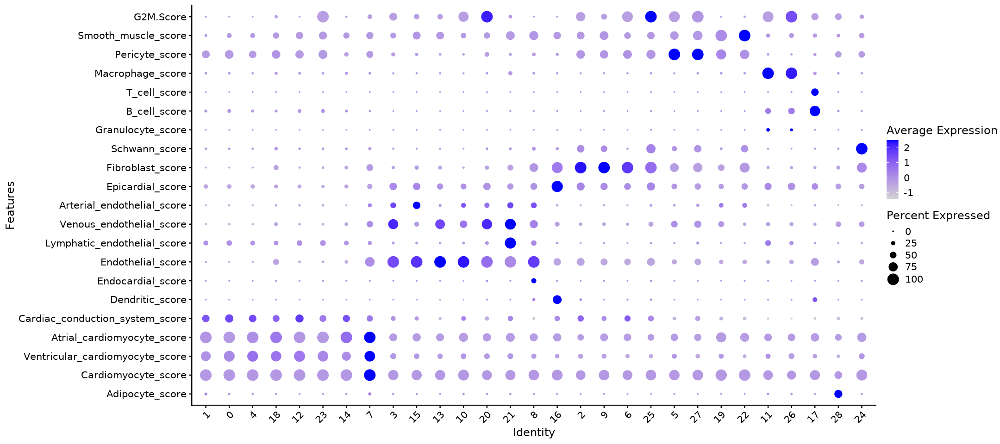

In [25]:
options(repr.plot.width = 18, repr.plot.height= 8)
p = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 
p

In [26]:
pdf(file="../../plots/annotation/cluster_marker_dotplot_sorted.pdf",width = 18, height = 5)
p
dev.off()

png 
  2

## Name clusters

In [27]:
subtypes = c("Cardiomyocyte_adult",#1,
              rep("Cardiomyocyte_juvenile",3),# 0,4,18,
              "Cardiomyocyte_infant",# 12,
              "Cardiomyocyte_cycling", #23
              "Cardiomyocyte_atrial", #14
              rep("Endothelial_juvenile",4), #3,7,15,13,
              "Endothelial_adult", # 10
              "Endothelial_cycling", #20
              "Lymphatic_endothelial", # 21
              "Endocardial", # 8
              "Epicardial", # 16
              rep("Fibroblast_juvenile",2), # 2,9,
              "Fibroblast_adult", #6,
              "Fibroblast_cycling", # 25
              "Pericyte", # 5
              "Pericyte_cycling", # 27
              "Smooth_muscle1", # 19
              "Smooth_muscle2", # 22
              "Macrophage", # 11
              "Macrophage_cycling", # 26
              "Lymphocyte", # 17
              "Adipocyte", # 28
              "Schwann" # 24
             )

names(subtypes) = levels(Idents(obj))
obj = RenameIdents(obj, subtypes)

order = c("Cardiomyocyte_infant","Cardiomyocyte_juvenile","Cardiomyocyte_adult","Cardiomyocyte_cycling","Cardiomyocyte_atrial",
          "Endothelial_juvenile","Endothelial_adult","Endothelial_cycling","Lymphatic_endothelial",
          "Endocardial","Epicardial",
          "Fibroblast_juvenile","Fibroblast_adult","Fibroblast_cycling",
          "Pericyte","Pericyte_cycling",
          "Smooth_muscle1","Smooth_muscle2",
          "Macrophage","Macrophage_cycling","Lymphocyte",
          "Adipocyte","Schwann") 
Idents(obj) = factor(Idents(obj), levels = order)
obj$subtypes = Idents(obj)


In [28]:
table(obj$subtypes)


  Cardiomyocyte_infant Cardiomyocyte_juvenile    Cardiomyocyte_adult 
                  3982                  17701                   9231 
 Cardiomyocyte_cycling   Cardiomyocyte_atrial   Endothelial_juvenile 
                   541                   2425                  16897 
     Endothelial_adult    Endothelial_cycling  Lymphatic_endothelial 
                  4134                    791                    786 
           Endocardial             Epicardial    Fibroblast_juvenile 
                  4436                   1139                  12322 
      Fibroblast_adult     Fibroblast_cycling               Pericyte 
                  5116                    347                   5238 
      Pericyte_cycling         Smooth_muscle1         Smooth_muscle2 
                   233                    800                    596 
            Macrophage     Macrophage_cycling             Lymphocyte 
                  4049                    283                   1048 
             Adipoc

In [29]:
obj$celltypes = obj$subtypes

obj$celltypes = gsub("Cardiomyocyte_infant","Cardiomyocyte",obj$celltypes)
obj$celltypes = gsub("Cardiomyocyte_juvenile","Cardiomyocyte",obj$celltypes)
obj$celltypes = gsub("Cardiomyocyte_adult","Cardiomyocyte",obj$celltypes)
obj$celltypes = gsub("Cardiomyocyte_cycling","Cardiomyocyte",obj$celltypes)
obj$celltypes = gsub("Cardiomyocyte_atrial","Cardiomyocyte",obj$celltypes)
obj$celltypes = gsub("Endothelial_cycling","Endothelial",obj$celltypes)
obj$celltypes = gsub("Endothelial_adult","Endothelial",obj$celltypes)
obj$celltypes = gsub("Endothelial_juvenile","Endothelial",obj$celltypes)
obj$celltypes = gsub("Fibroblast_juvenile","Fibroblast",obj$celltypes)
obj$celltypes = gsub("Fibroblast_adult","Fibroblast",obj$celltypes)
obj$celltypes = gsub("Fibroblast_cycling","Fibroblast",obj$celltypes)
obj$celltypes = gsub("Pericyte_cycling","Pericyte",obj$celltypes)
obj$celltypes = gsub("Smooth_muscle1","Smooth_muscle",obj$celltypes)
obj$celltypes = gsub("Smooth_muscle2","Smooth_muscle",obj$celltypes)
obj$celltypes = gsub("Macrophage_cycling","Macrophage",obj$celltypes)
obj$celltypes = gsub("Macrophage_cycling","Macrophage",obj$celltypes)

order = c("Cardiomyocyte",
          "Endothelial","Lymphatic_endothelial",
          "Endocardial","Epicardial",
          "Fibroblast",
          "Pericyte",
          "Smooth_muscle",
          "Macrophage","Lymphocyte",
          "Adipocyte","Schwann") 
obj$celltypes = factor(obj$celltypes, levels = order)

table(obj$celltypes)

obj$gen_celltype = obj$celltypes
obj$gen_celltype = gsub("Lymphatic_endothelial","Endothelial",obj$gen_celltype)
obj$gen_celltype = gsub("Endocardial","Endothelial",obj$gen_celltype)
obj$gen_celltype = gsub("Epicardial","Stromal",obj$gen_celltype)
obj$gen_celltype = gsub("Lymphocyte","Immune",obj$gen_celltype)
obj$gen_celltype = gsub("Macrophage","Immune",obj$gen_celltype)

order = c("Cardiomyocyte",
          "Endothelial",
          "Stromal",
          "Fibroblast",
          "Pericyte",
          "Smooth_muscle",
          "Immune",
          "Adipocyte","Schwann") 
obj$gen_celltype = factor(obj$gen_celltype, levels = order)

table(obj$gen_celltype)


        Cardiomyocyte           Endothelial Lymphatic_endothelial 
                33880                 21822                   786 
          Endocardial            Epicardial            Fibroblast 
                 4436                  1139                 17785 
             Pericyte         Smooth_muscle            Macrophage 
                 5471                  1396                  4332 
           Lymphocyte             Adipocyte               Schwann 
                 1048                   226                   487 


Cardiomyocyte   Endothelial       Stromal    Fibroblast      Pericyte 
        33880         27044          1139         17785          5471 
Smooth_muscle        Immune     Adipocyte       Schwann 
         1396          5380           226           487 

## Update metadata for integration with other ENCODE data
submission_celltype, cell_type_mnemonic, CL_ID_annotation

In [30]:
obj$submission_celltype  = obj$celltypes
obj$submission_celltype = gsub("Cardiomyocyte","cardiomyocyte",obj$submission_celltype)
obj$submission_celltype = gsub("Endothelial","cardiac endothelial cell",obj$submission_celltype)
obj$submission_celltype = gsub("Lymphatic_endothelial","lymphatic endothelial cell",obj$submission_celltype)
obj$submission_celltype = gsub("Endocardial","endocardial cell",obj$submission_celltype)
obj$submission_celltype = gsub("Epicardial","epicardial cell",obj$submission_celltype)
obj$submission_celltype = gsub("Fibroblast","cardiac fibroblast",obj$submission_celltype)
obj$submission_celltype = gsub("Pericyte","pericyte",obj$submission_celltype)
obj$submission_celltype = gsub("Smooth_muscle","smooth muscle cell",obj$submission_celltype)
obj$submission_celltype = gsub("Macrophage","macrophage",obj$submission_celltype)
obj$submission_celltype = gsub("Lymphocyte","lymphocyte",obj$submission_celltype)
obj$submission_celltype = gsub("Adipocyte","adipocyte",obj$submission_celltype)
obj$submission_celltype = gsub("Schwann","Schwann cell",obj$submission_celltype)

table(obj$submission_celltype)

obj$cell_type_mnemonic  = obj$submission_celltype
obj$cell_type_mnemonic = gsub("\\<cardiomyocyte\\>","CM",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<cardiac endothelial cell\\>","ENDO_CRD",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<lymphatic endothelial cell\\>","ENDO_LYMP_HRT",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<endocardial cell\\>","ENDCRD_HRT",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<epicardial cell\\>","EPICRD_HRT",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<cardiac fibroblast\\>","FIB_CRD",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<pericyte\\>","PERI_HRT",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<smooth muscle cell\\>","SMC_HRT",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<macrophage\\>","MACRO_HRT",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<lymphocyte\\>","LYMPC_HRT",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<adipocyte\\>","ADIP_HRT",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<Schwann cell\\>","SCHWN_HRT",obj$cell_type_mnemonic)

table(obj$cell_type_mnemonic)

obj$CL_ID_annotation  = obj$cell_type_mnemonic
obj$CL_ID_annotation = gsub("CM","CL:0000746",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("ENDO_CRD","CL:0010008",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("ENDO_LYMP_HRT","CL:0002138",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("ENDCRD_HRT","CL:0002350",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("EPICRD_HRT","CL:0011019",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("FIB_CRD","CL:0002548",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("PERI_HRT","CL:0000669",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("SMC_HRT","CL:0000192",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("MACRO_HRT","CL:0000235",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("LYMPC_HRT","CL:0000542",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("ADIP_HRT","CL:0000136",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("SCHWN_HRT","CL:0002573",obj$CL_ID_annotation)

table(obj$CL_ID_annotation)

obj$synapse = synapse_id
obj$tissue_mnemonic = enc_abrv



              Schwann cell                  adipocyte 
                       487                        226 
  cardiac endothelial cell         cardiac fibroblast 
                     21822                      17785 
             cardiomyocyte           endocardial cell 
                     33880                       4436 
           epicardial cell lymphatic endothelial cell 
                      1139                        786 
                lymphocyte                 macrophage 
                      1048                       4332 
                  pericyte         smooth muscle cell 
                      5471                       1396 


     ADIP_HRT            CM    ENDCRD_HRT      ENDO_CRD ENDO_LYMP_HRT 
          226         33880          4436         21822           786 
   EPICRD_HRT       FIB_CRD     LYMPC_HRT     MACRO_HRT      PERI_HRT 
         1139         17785          1048          4332          5471 
    SCHWN_HRT       SMC_HRT 
          487          1396 


CL:0000136 CL:0000192 CL:0000235 CL:0000542 CL:0000669 CL:0000746 CL:0002138 
       226       1396       4332       1048       5471      33880        786 
CL:0002350 CL:0002548 CL:0002573 CL:0010008 CL:0011019 
      4436      17785        487      21822       1139 

# Annotated plots

In [31]:
subtype_cols = annot_cols[match(levels(obj$subtypes),annot_cols$subtypes),"subtype_color"]
celltype_cols = annot_cols[match(levels(obj$celltypes),annot_cols$celltypes),"celltype_color"]
gen_celltype_cols = annot_cols[match(levels(obj$gen_celltype),annot_cols$gen_celltype),"gen_celltype_color"]

Warning message:
"ggrepel: 17 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 3 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


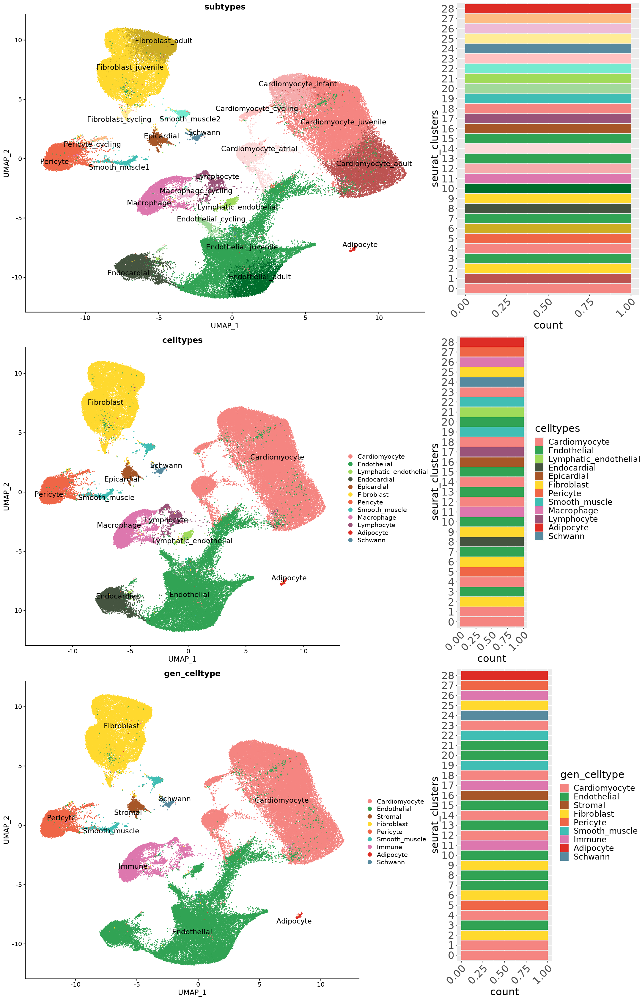

In [32]:
options(repr.plot.width = 18, repr.plot.height = 28)

umap_subtypes = DimPlot(obj, reduction = "umap", group.by = "subtypes", label = TRUE, 
                        label.size = 5, repel = TRUE) + scale_color_manual(values = subtype_cols) & NoLegend()
cluster_subtypes = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=subtypes)) + 
    scale_fill_manual(values = subtype_cols) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()& NoLegend()


umap_celltypes = DimPlot(obj, reduction = "umap", group.by = "celltypes", label = TRUE, 
                        label.size = 5, repel = TRUE) + scale_color_manual(values = celltype_cols)
cluster_celltypes = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=celltypes)) + 
    scale_fill_manual(values = celltype_cols) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()

umap_gen_celltypes = DimPlot(obj, reduction = "umap", group.by = "gen_celltype", label = TRUE, 
                        label.size = 5, repel = TRUE) + scale_color_manual(values = gen_celltype_cols)
cluster_gen_celltypes = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=gen_celltype)) + 
    scale_fill_manual(values = gen_celltype_cols) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()


gridExtra::grid.arrange(
    umap_subtypes, cluster_subtypes,
    umap_celltypes, cluster_celltypes,
    umap_gen_celltypes, cluster_gen_celltypes,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))


In [33]:
pdf(file="../../plots/annotation/UMAPs_barplots.pdf",width = 18,height=28)

gridExtra::grid.arrange(
    umap_subtypes, cluster_subtypes,
    umap_celltypes, cluster_celltypes,
    umap_gen_celltypes, cluster_gen_celltypes,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))

dev.off()

png 
  2

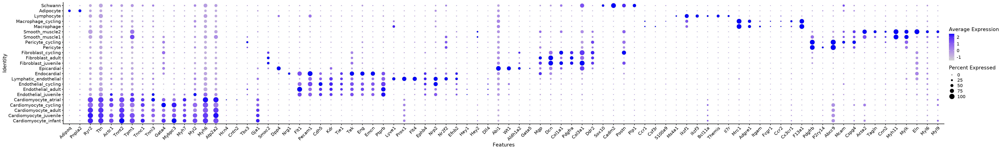

In [34]:
options(repr.plot.width = 40, repr.plot.height = 6)

Idents(obj) = obj$subtypes
p = DotPlot(obj, features =  unique(markers$Gene)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
p


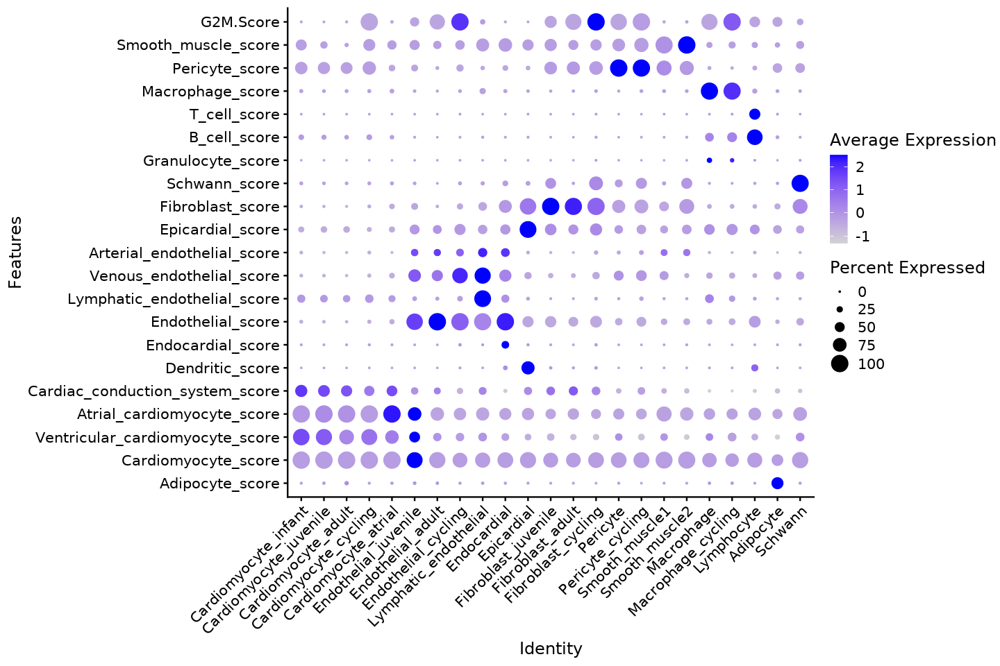

In [35]:
options(repr.plot.width = 12, repr.plot.height = 8)

p1 = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 

p1


In [36]:
pdf(file="../../plots/annotation/subtypes_marker_dotplot.pdf",width = 40, height = 6)
p
dev.off()

png 
  2

In [37]:
pdf(file="../../plots/annotation/subtypes_marker_score_dotplot.pdf",width = 12, height = 8)
p1
dev.off()

png 
  2

Warning message:
"ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 3 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


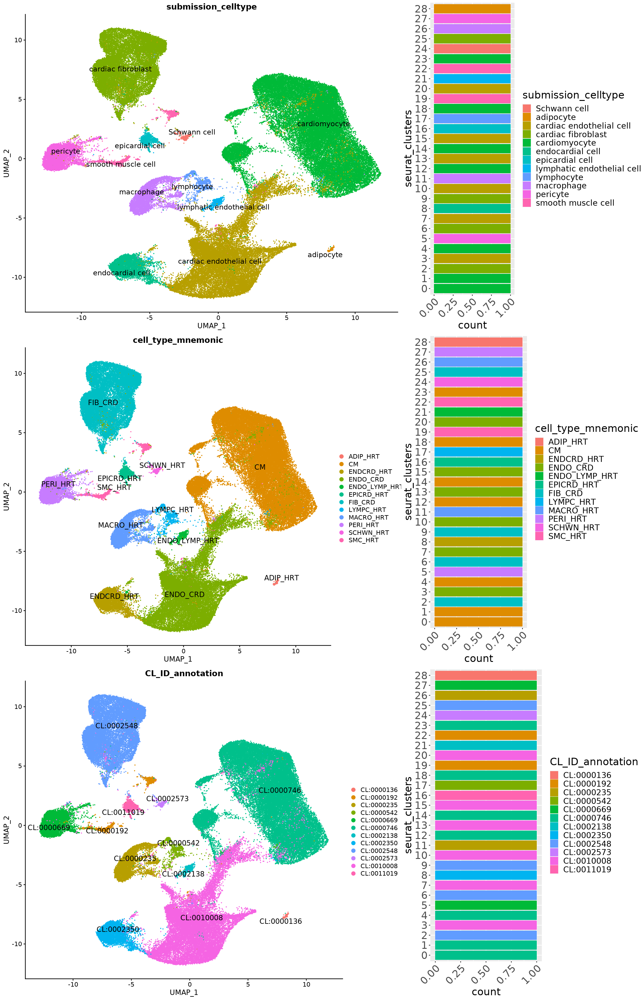

In [38]:
options(repr.plot.width = 18, repr.plot.height = 28)

umap1 = DimPlot(obj, reduction = "umap", group.by = "submission_celltype", label = TRUE, 
                        label.size = 5, repel = TRUE) & NoLegend()
cluster1 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=submission_celltype)) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()#& NoLegend()


umap2 = DimPlot(obj, reduction = "umap", group.by = "cell_type_mnemonic", label = TRUE, 
                        label.size = 5, repel = TRUE)
cluster2 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=cell_type_mnemonic)) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()

umap3 = DimPlot(obj, reduction = "umap", group.by = "CL_ID_annotation", label = TRUE, 
                        label.size = 5, repel = TRUE)
cluster3 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=CL_ID_annotation)) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()


gridExtra::grid.arrange(
    umap1, cluster1,
    umap2, cluster2,
    umap3, cluster3,
  widths = c(2,1.2),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))


In [39]:
pdf(file="../../plots/annotation/UMAPs_barplots_submissions.pdf",
    width = 15, height = 10)
gridExtra::grid.arrange(
    umap1, cluster1,
    umap2, cluster2,
    umap3, cluster3,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))
dev.off()


png 
  2

## Get ENC dataset (experiment_accession) from enc4_mouse_metadata_fixed.csv

In [40]:
expt_acc = read.csv("../../../ref/enc4_mouse_metadata_fixed.csv")
expt_acc = expt_acc[,c("sublibrary_sample","experiment_accession")]

In [41]:
seurat_metadata = obj@meta.data
seurat_metadata$experiment_accession = NULL

In [42]:
seurat_metadata = left_join(seurat_metadata,expt_acc,by="sublibrary_sample")

In [43]:
obj$rna_experiment_accession = seurat_metadata$experiment_accession

In [44]:
table(obj$rna_experiment_accession)


ENCSR041KFB ENCSR122DEZ ENCSR125HRM ENCSR147TEP ENCSR237OCP ENCSR247PQY 
       3503         309         194        1697          89         233 
ENCSR266RTS ENCSR277UKO ENCSR303EIR ENCSR305SPL ENCSR333SLJ ENCSR337DKH 
       3233         248        1715         845       11051          60 
ENCSR415HEP ENCSR417FCM ENCSR440PMT ENCSR442NQZ ENCSR455YDL ENCSR462HCD 
      10531        5760        3025        2398         115        4132 
ENCSR533IGQ ENCSR559AAG ENCSR568GGW ENCSR573UKV ENCSR594LDC ENCSR617CNE 
       8722          70        8521          76        1219        1424 
ENCSR644VVE ENCSR665HPR ENCSR688APT ENCSR729BRE ENCSR743OKJ ENCSR764CYB 
       5377        4833         202        3774          42        3501 
ENCSR809WJL ENCSR860LQG ENCSR868XSG ENCSR906KCJ ENCSR938YKJ ENCSR975YAQ 
         99        1025         171        1612        2808         194 

# Save

In [107]:
saveRDS(obj,file=paste0("../../seurat/",tissue,"_Parse_10x_integrated.rds"))


In [99]:
write.csv(obj@meta.data,file=paste0("../../seurat/",str_to_lower(tissue),"_Parse_10x_integrated_metadata.csv"))



In [100]:
obj_parse = subset(obj, subset = technology == "Parse")
saveRDS(obj_parse, file = paste0("../../seurat/",tissue,"_Parse.rds"))

obj_10x = subset(obj, subset = technology == "10x")
saveRDS(obj_10x, file = paste0("../../seurat/",tissue,"_10x.rds"))


In [101]:
write.csv(obj_parse@meta.data, file=paste0("../../seurat/",tissue,"_Parse_metadata.csv"))

write.csv(obj_10x@meta.data, file=paste0("../../seurat/",tissue,"_10x_metadata.csv"))



# Subset for regulatory genes & save matrices for input into Topyfic

In [102]:
reg_genes = read.csv("../../../ref/gene_display_table_expressed_7categories.csv")

In [103]:
table(reg_genes$gene_name %in% rownames(obj@assays$RNA@counts))


TRUE 
2701 

In [104]:
mtx_parse = obj_parse@assays$RNA@counts
mtx_parse = mtx_parse[rownames(mtx_parse) %in% reg_genes$gene_name, ]
mtx_parse = mtx_parse[match(reg_genes$gene_name, rownames(mtx_parse)), ]

mtx_10x = obj_10x@assays$RNA@counts
mtx_10x = mtx_10x[rownames(mtx_10x) %in% reg_genes$gene_name, ]
mtx_10x = mtx_10x[match(reg_genes$gene_name, rownames(mtx_10x)), ]

In [105]:
table(rownames(mtx_parse) == reg_genes$gene_name)
table(rownames(mtx_10x) == reg_genes$gene_name)


TRUE 
2701 


TRUE 
2701 

In [106]:
writeMM(mtx_parse, file=paste0("../../seurat/",tissue,"_Parse.mtx"))

writeMM(mtx_10x, file=paste0("../../seurat/",tissue,"_10x.mtx"))



NULL

NULL